In [ ]:
!pip install mne mne_bids utils

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.8/166.8 kB 11.9 MB/s eta 0:00:00
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13906 sha256=28e193a0bcb5aa4a8fbc85f3975b4de3c19f86c7d1341f45656a816f6a5f4990
  Stored in directory: /root/.cache/pip/wheels/15/0c/b3/674aea8c5d91c642c817d4d630bd58faa316724b136844094d
Successfully built utils


In [ ]:
import numpy as np
import mne
import pandas as pd
import mne_bids
from sklearn.utils import resample

In [ ]:
bids_dir='/content/drive/MyDrive/Dataset iEEG'
subjects = mne_bids.get_entity_vals(bids_dir, 'subject')

subject = '01'
acquisition = 'clinical'
task = 'film'
datatype = 'ieeg'
session = 'iemu'

In [ ]:
channels_path = mne_bids.BIDSPath(subject=subject,
                                    session=session,
                                    suffix='channels',
                                    extension='tsv',
                                    datatype=datatype,
                                    task=task,
                                    acquisition=acquisition,
                                    root=bids_dir)
channels = pd.read_csv(str(channels_path.match()[0]), sep='\t', header=0, index_col=None)

In [ ]:
data_path = mne_bids.BIDSPath(subject=subject,
                                    session=session,
                                    suffix='ieeg',
                                    extension='vhdr',
                                    datatype=datatype,
                                    task=task,
                                    acquisition=acquisition,
                                    root=bids_dir)
raw = mne.io.read_raw_brainvision(str(data_path.match()[0]), scale=1.0, preload=False, verbose=True)
raw.set_channel_types({ch_name: str(x).lower()
                if str(x).lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
                                for ch_name, x in zip(raw.ch_names, channels['type'].values)})
raw.drop_channels([raw.ch_names[i] for i, j in enumerate(raw.get_channel_types()) if j == 'misc'])

Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-01/ses-iemu/ieeg/sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...


<ipython-input-5-81d39aad605b>:10: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG+, MKR1+, MKR2+, ORB+, abdo+, thor+ has changed from V to NA.
  raw.set_channel_types({ch_name: str(x).lower()


<RawBrainVision | sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.eeg, 103 x 860254 (420.0 s), ~89 KiB, data not loaded>

In [ ]:
bad_channels = channels['name'][(channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad')].tolist()
raw.info['bads'].extend([ch for ch in bad_channels])
raw.drop_channels(raw.info['bads'])

<RawBrainVision | sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.eeg, 101 x 860254 (420.0 s), ~87 KiB, data not loaded>

In [ ]:
raw.load_data()

Reading 0 ... 860253  =      0.000 ...   420.045 secs...


<RawBrainVision | sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.eeg, 103 x 860254 (420.0 s), ~676.1 MiB, data loaded>

In [ ]:
raw.notch_filter(freqs=np.arange(50, 251, 50))

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done 103 out of 103 | elapsed:    5.6s finished


<RawBrainVision | sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.eeg, 103 x 860254 (420.0 s), ~676.1 MiB, data loaded>

In [ ]:
raw_car, _ = mne.set_eeg_reference(raw.copy(), 'average')

sEEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('sEEG',) reference.


In [ ]:
gamma = raw_car.copy().filter(60, 120).apply_hilbert(envelope=True).get_data().T

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 60 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 60.00
- Lower transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 52.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 451 samples (0.220 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 103 out of 103 | elapsed:    9.1s finished


Used Annotations descriptions: [np.str_('Stimulus/end task'), np.str_('Stimulus/music'), np.str_('Stimulus/speech')]
Using matplotlib as 2D backend.


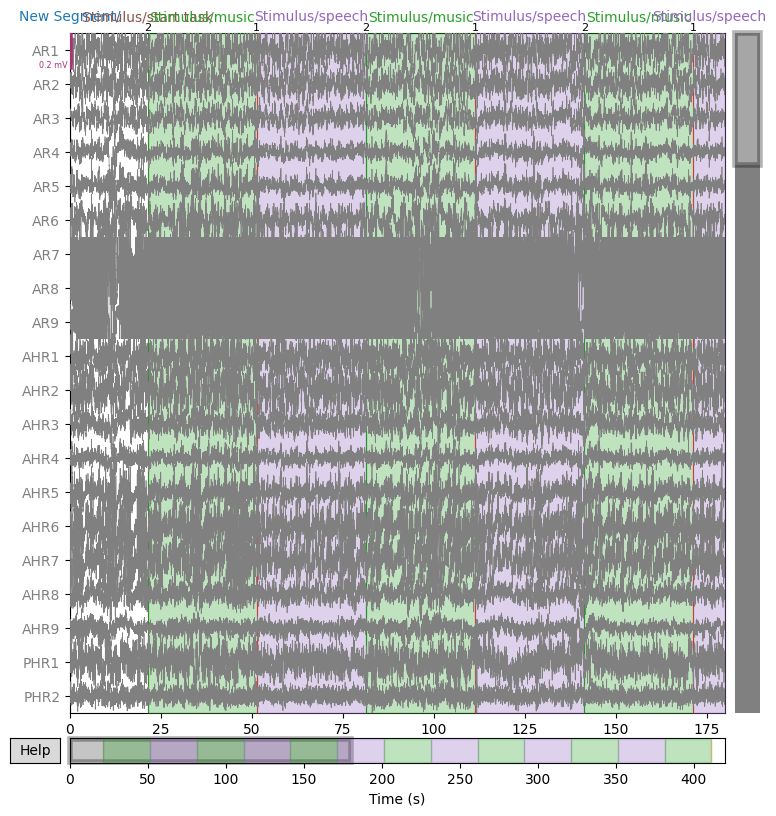

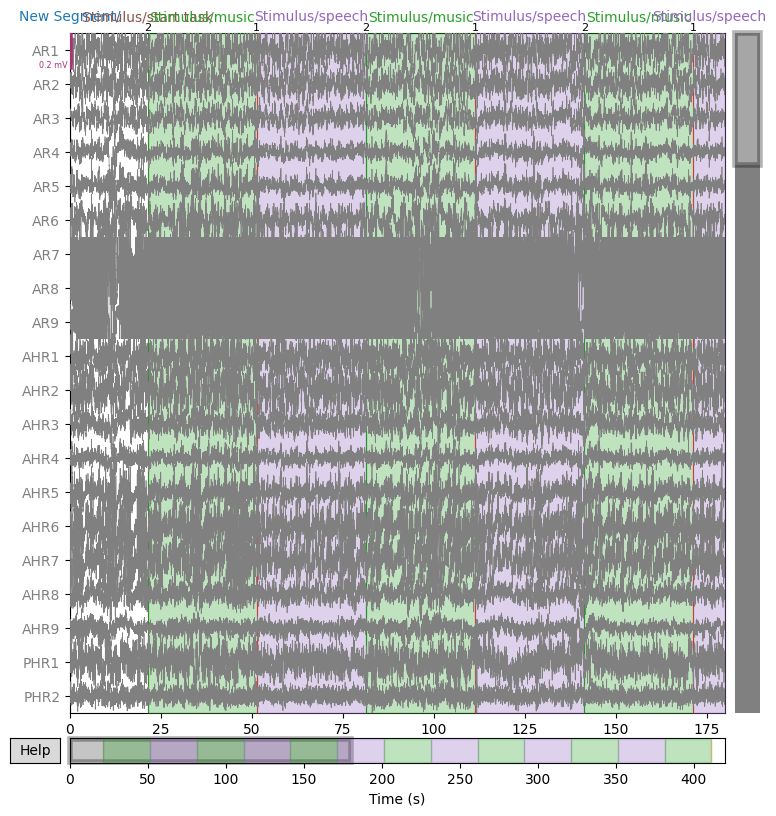

In [ ]:
custom_mapping = {'Stimulus/music': 2, 'Stimulus/speech': 1,
                  'Stimulus/end task': 5}  # 'Stimulus/task end' in laan
events, event_id = mne.events_from_annotations(raw_car, event_id=custom_mapping,
                                                         use_rounding=False)

raw_car.plot(events=events, start=0, duration=180, color='gray', event_color={2: 'g', 1: 'r'}, bgcolor='w')

In [ ]:
gamma_cropped = gamma[events[0, 0]:events[-1, 0]]

Data Loading

Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-01/ses-iemu/ieeg/sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 860253  =      0.000 ...   420.045 secs...


<ipython-input-5-38594efecdcb>:33: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG+, MKR1+, MKR2+, ORB+, abdo+, thor+ has changed from V to NA.
  raw.set_channel_types(channel_types)



✅ Total channels loaded: 111
✅ Channel type distribution:
seeg    103
misc      8
Name: count, dtype: int64
✅ Bad channels marked:
['AR8', 'MFL15']


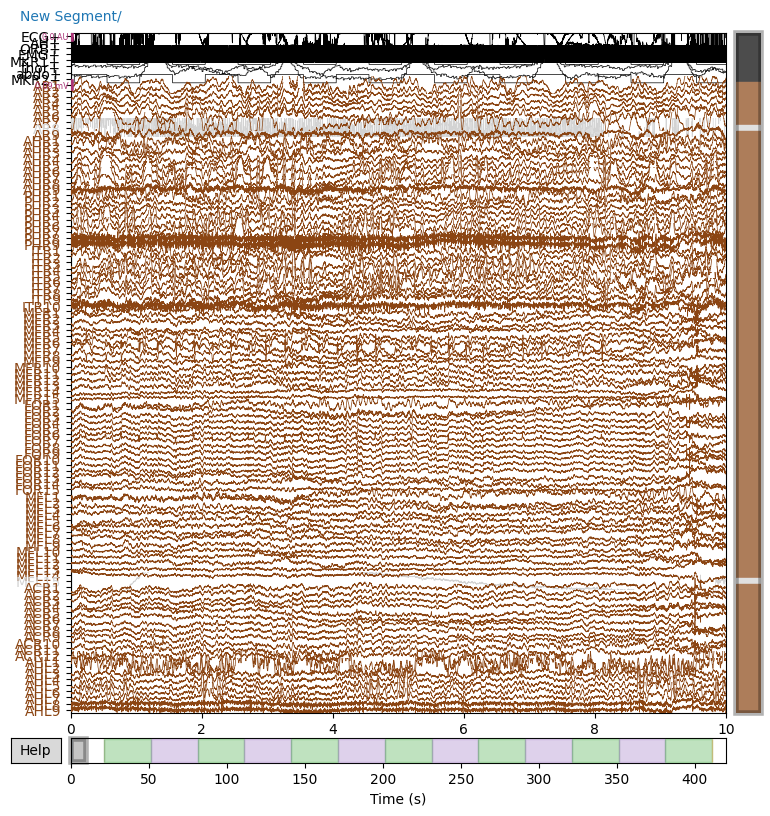

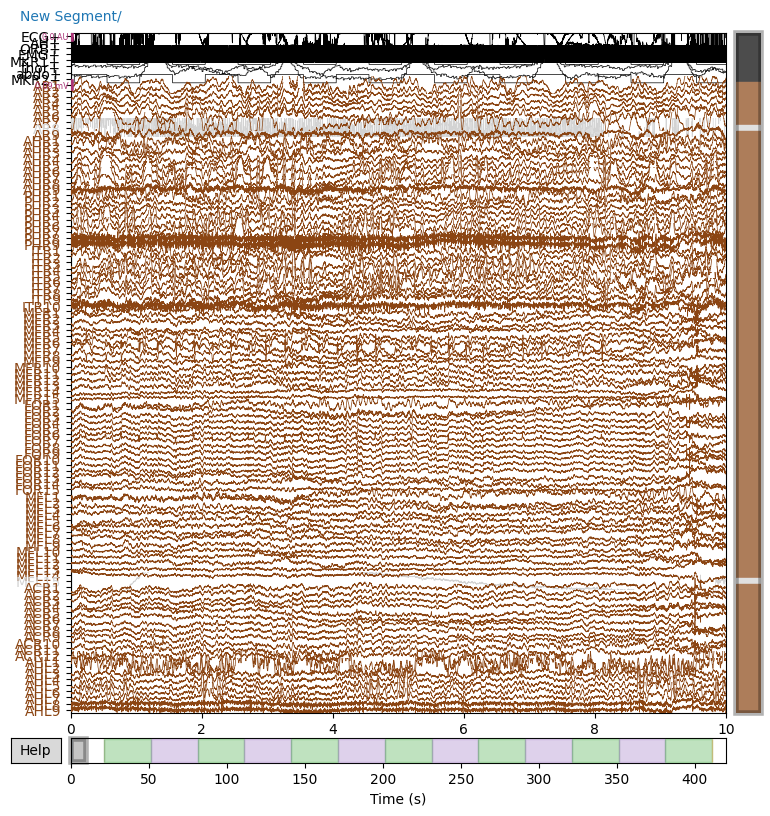

In [ ]:
import numpy as np
import mne
import pandas as pd
import mne_bids

# Set BIDS directory and subject details
bids_dir = '/content/drive/MyDrive/Dataset iEEG'
subject = '01'
session = 'iemu'
task = 'film'
acquisition = 'clinical'
datatype = 'ieeg'

# Load channel info from channels.tsv
channels_path = mne_bids.BIDSPath(subject=subject, session=session, task=task,
                                   acquisition=acquisition, datatype=datatype,
                                   suffix='channels', extension='.tsv', root=bids_dir)
channels_file = channels_path.match()[0]
channels = pd.read_csv(channels_file, sep='\t')

# Load iEEG recording (.vhdr format)
data_path = mne_bids.BIDSPath(subject=subject, session=session, task=task,
                               acquisition=acquisition, datatype=datatype,
                               suffix='ieeg', extension='.vhdr', root=bids_dir)
raw_file = data_path.match()[0]
raw = mne.io.read_raw_brainvision(raw_file, preload=True)

# Assign channel types from channels.tsv
channel_types = {
    name: t.lower() if str(t).lower() in ['eeg', 'ecog', 'seeg'] else 'misc'
    for name, t in zip(raw.ch_names, channels['type'].values)
}
raw.set_channel_types(channel_types)

# Mark bad channels (do NOT drop them)
bad_channels = channels.loc[
    (channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad'),
    'name'
].tolist()
raw.info['bads'].extend(bad_channels)

# Print details
print("\n✅ Total channels loaded:", len(raw.ch_names))
print("✅ Channel type distribution:")
print(pd.Series(raw.get_channel_types()).value_counts())
print("✅ Bad channels marked:")
print(raw.info['bads'])

# Plot full data (including bad and misc channels)
raw.plot(n_channels=len(raw.ch_names), scalings='auto', title=f"Subject {subject} - Raw iEEG")


Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-01/ses-iemu/ieeg/sub-01_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 860253  =      0.000 ...   420.045 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 13517 samples (6.600 s)



<ipython-input-6-c983b0a1f9eb>:46: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG+, MKR1+, MKR2+, ORB+, abdo+, thor+ has changed from V to NA.
  raw.set_channel_types(ch_types)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 103 out of 103 | elapsed:    7.0s finished


sEEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('sEEG',) reference.
Subject 01 iEEG data loaded with 111 channels
Bad channels marked: ['AR8', 'MFL15']
Channel types:
seeg    103
misc      8
Name: count, dtype: int64


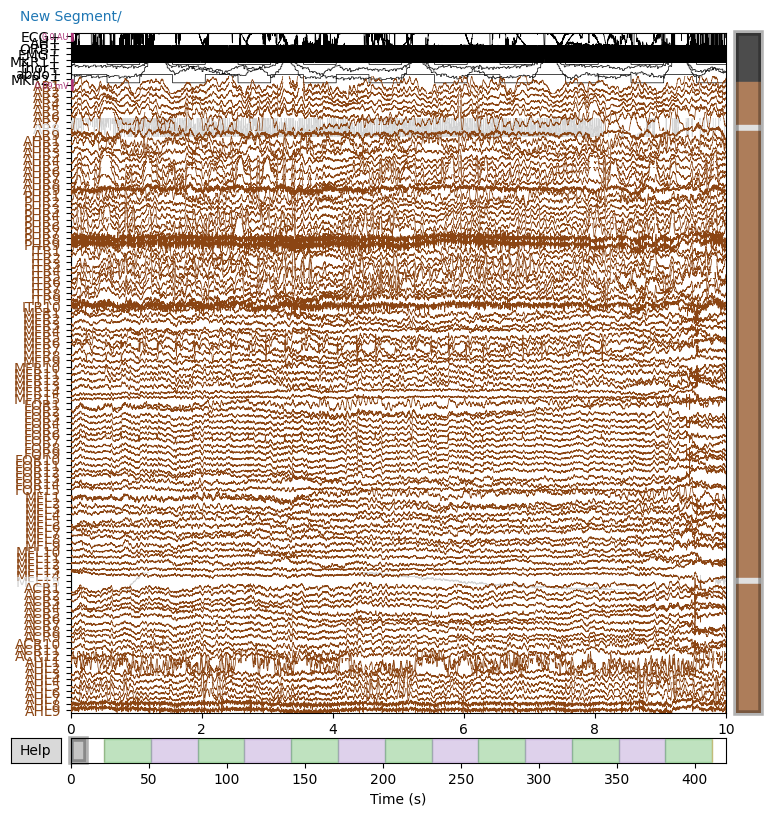

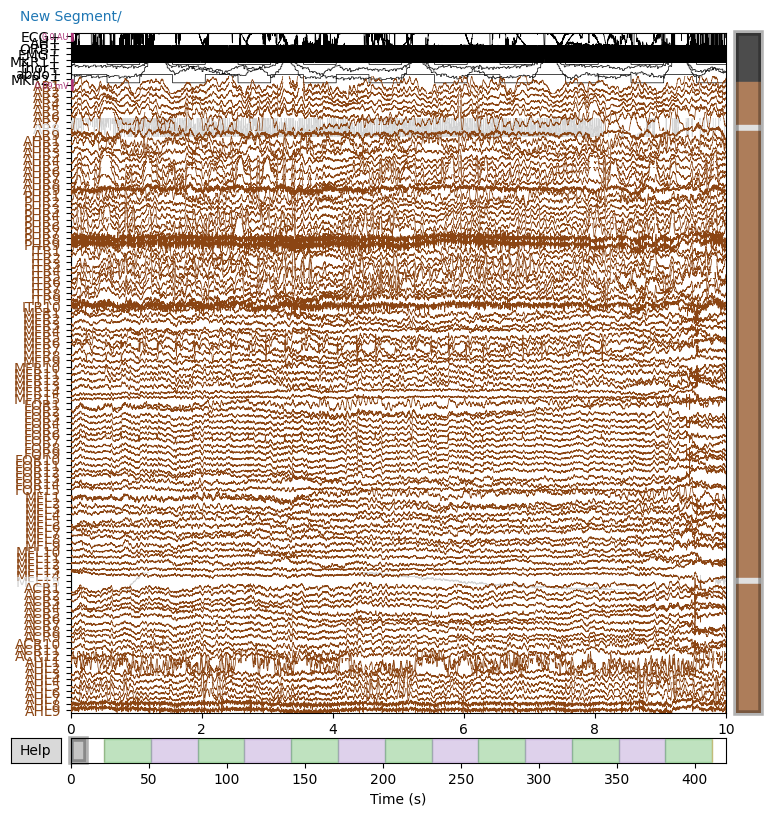

In [ ]:
import mne
import mne_bids
import pandas as pd

# Define your BIDS root directory where the dataset is stored
bids_root = '/content/drive/MyDrive/Dataset iEEG'

# Set the subject, session, task, and acquisition identifiers as per the dataset
subject = '01'           # example subject ID
session = 'iemu'         # session ID from dataset
task = 'film'            # task label as per dataset
acquisition = 'clinical' # acquisition label as per dataset
datatype = 'ieeg'        # modality

# Create BIDSPath to channels.tsv file to read channel info
channels_path = mne_bids.BIDSPath(subject=subject,
                                  session=session,
                                  task=task,
                                  acquisition=acquisition,
                                  datatype=datatype,
                                  suffix='channels',
                                  extension='.tsv',
                                  root=bids_root)

# Load channels.tsv to get channel types and bad channel info
channels = pd.read_csv(str(channels_path.match()[0]), sep='\t')

# Create BIDSPath for the raw iEEG data file (.vhdr for BrainVision format)
raw_path = mne_bids.BIDSPath(subject=subject,
                             session=session,
                             task=task,
                             acquisition=acquisition,
                             datatype=datatype,
                             suffix='ieeg',
                             extension='.vhdr',
                             root=bids_root)

# Load the raw iEEG data
raw = mne.io.read_raw_brainvision(str(raw_path.match()[0]), preload=True)

# Map channel types using channels.tsv info
ch_types = {
    ch_name: ch_type.lower() if ch_type.lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
    for ch_name, ch_type in zip(raw.ch_names, channels['type'])
}
raw.set_channel_types(ch_types)

# Mark bad channels from channels.tsv without dropping
bad_chs = channels.loc[(channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad'), 'name'].tolist()
raw.info['bads'].extend(bad_chs)

# OPTIONAL: Notch filter to remove line noise at multiples of 50 Hz
raw.notch_filter(freqs=[50, 100, 150, 200, 250])

# OPTIONAL: Set EEG reference (Common Average Reference)
raw_car, _ = mne.set_eeg_reference(raw.copy(), ref_channels='average')

# Print summary info to confirm successful loading
print(f"Subject {subject} iEEG data loaded with {len(raw.ch_names)} channels")
print(f"Bad channels marked: {raw.info['bads']}")
print(f"Channel types:\n{pd.Series(raw.get_channel_types()).value_counts()}")

# Plot a snippet of the raw data with all channels visible (adjust scalings to avoid overlap)
raw.plot(n_channels=len(raw.ch_names), scalings='auto', title=f"Subject {subject} iEEG Data")

# Now raw or raw_car is ready for further processing or model input


Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-02/ses-iemu/ieeg/sub-02_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 291997  =      0.000 ...   570.307 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)



<ipython-input-7-9161217dfa63>:39: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(str(raw_path.match()[0]), preload=True)
<ipython-input-7-9161217dfa63>:46: RuntimeWarning: The unit for channel(s) AH+, ECG+, MKR1+, MKR2+, abdo+, emg1+, emg2+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types(ch_types)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


ECoG channel type selected for re-referencing


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    1.5s finished


Applying average reference.
Applying a custom ('ECoG',) reference.
Subject 02 iEEG data loaded with 69 channels
Bad channels marked: ['F26']
Channel types:
ecog    48
seeg    12
misc     9
Name: count, dtype: int64


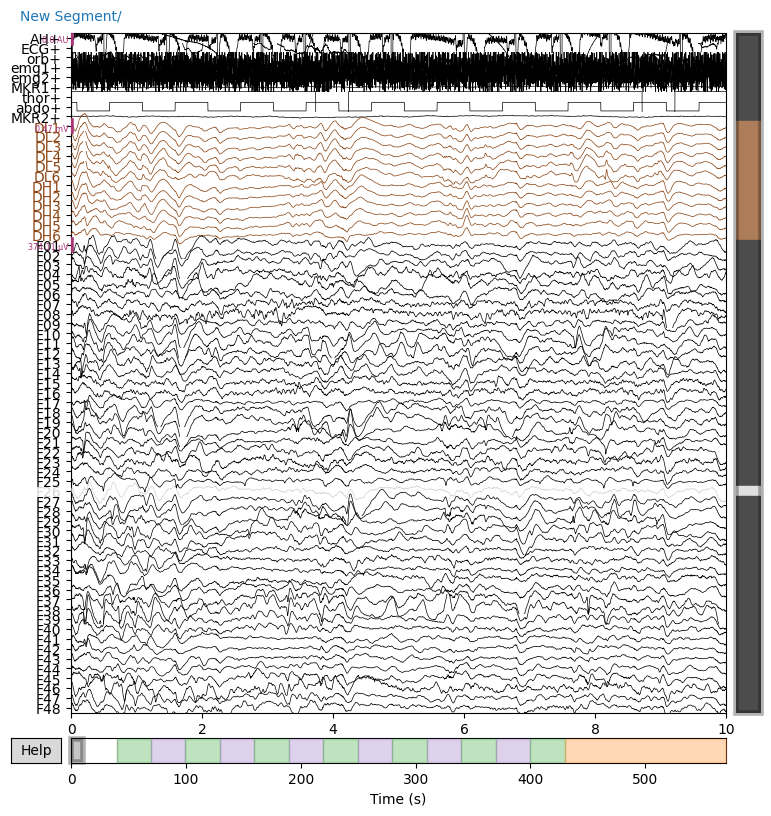

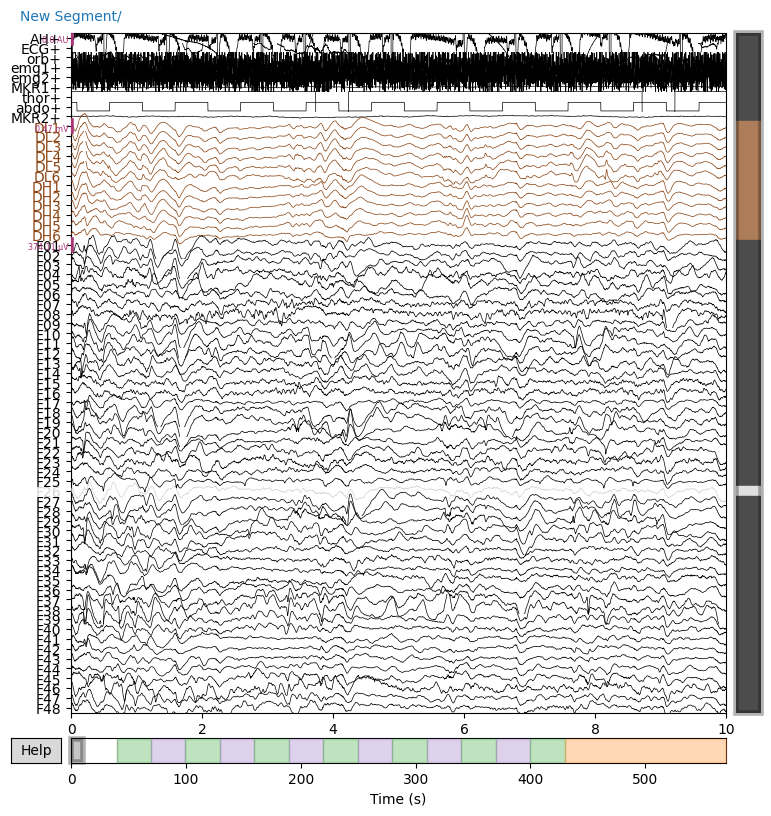

In [ ]:
import mne
import mne_bids
import pandas as pd

# Define your BIDS root directory where the dataset is stored
bids_root = '/content/drive/MyDrive/Dataset iEEG'

# Set the subject, session, task, and acquisition identifiers as per the dataset
subject = '02'           # example subject ID
session = 'iemu'         # session ID from dataset
task = 'film'            # task label as per dataset
acquisition = 'clinical' # acquisition label as per dataset
datatype = 'ieeg'        # modality

# Create BIDSPath to channels.tsv file to read channel info
channels_path = mne_bids.BIDSPath(subject=subject,
                                  session=session,
                                  task=task,
                                  acquisition=acquisition,
                                  datatype=datatype,
                                  suffix='channels',
                                  extension='.tsv',
                                  root=bids_root)

# Load channels.tsv to get channel types and bad channel info
channels = pd.read_csv(str(channels_path.match()[0]), sep='\t')

# Create BIDSPath for the raw iEEG data file (.vhdr for BrainVision format)
raw_path = mne_bids.BIDSPath(subject=subject,
                             session=session,
                             task=task,
                             acquisition=acquisition,
                             datatype=datatype,
                             suffix='ieeg',
                             extension='.vhdr',
                             root=bids_root)

# Load the raw iEEG data
raw = mne.io.read_raw_brainvision(str(raw_path.match()[0]), preload=True)

# Map channel types using channels.tsv info
ch_types = {
    ch_name: ch_type.lower() if ch_type.lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
    for ch_name, ch_type in zip(raw.ch_names, channels['type'])
}
raw.set_channel_types(ch_types)

# Mark bad channels from channels.tsv without dropping
bad_chs = channels.loc[(channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad'), 'name'].tolist()
raw.info['bads'].extend(bad_chs)

# OPTIONAL: Notch filter to remove line noise at multiples of 50 Hz
raw.notch_filter(freqs=[50, 100, 150, 200, 250])

# OPTIONAL: Set EEG reference (Common Average Reference)
raw_car, _ = mne.set_eeg_reference(raw.copy(), ref_channels='average')

# Print summary info to confirm successful loading
print(f"Subject {subject} iEEG data loaded with {len(raw.ch_names)} channels")
print(f"Bad channels marked: {raw.info['bads']}")
print(f"Channel types:\n{pd.Series(raw.get_channel_types()).value_counts()}")

# Plot a snippet of the raw data with all channels visible (adjust scalings to avoid overlap)
raw.plot(n_channels=len(raw.ch_names), scalings='auto', title=f"Subject {subject} iEEG Data")

# Now raw or raw_car is ready for further processing or model input


Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-03/ses-iemu/ieeg/sub-03_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 200476  =      0.000 ...   391.555 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)



<ipython-input-8-7b81bf14d016>:46: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG1+, EMG2+, R1, R2, R3, R4, R5, R6, R7, R8 has changed from V to NA.
  raw.set_channel_types(ch_types)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.9s


ECoG channel type selected for re-referencing


[Parallel(n_jobs=1)]: Done 110 out of 110 | elapsed:    1.5s finished


Applying average reference.
Applying a custom ('ECoG',) reference.
Subject 03 iEEG data loaded with 122 channels
Bad channels marked: ['C55', 'C56', 'C63', 'C64', 'T08', 'T15', 'T16', 'FP7', 'FP8']
Channel types:
ecog    104
misc     12
seeg      6
Name: count, dtype: int64


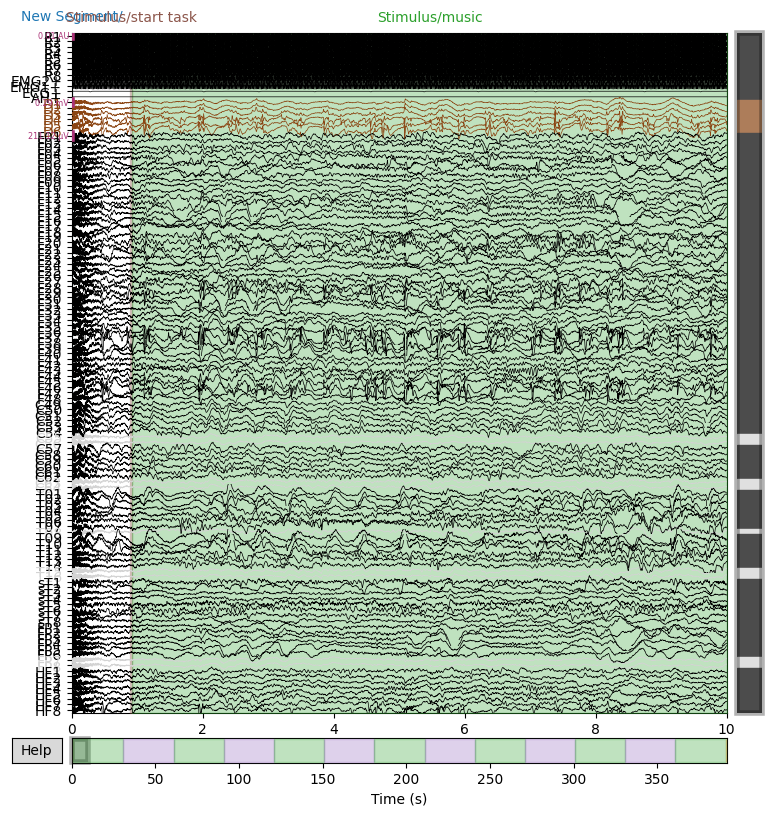

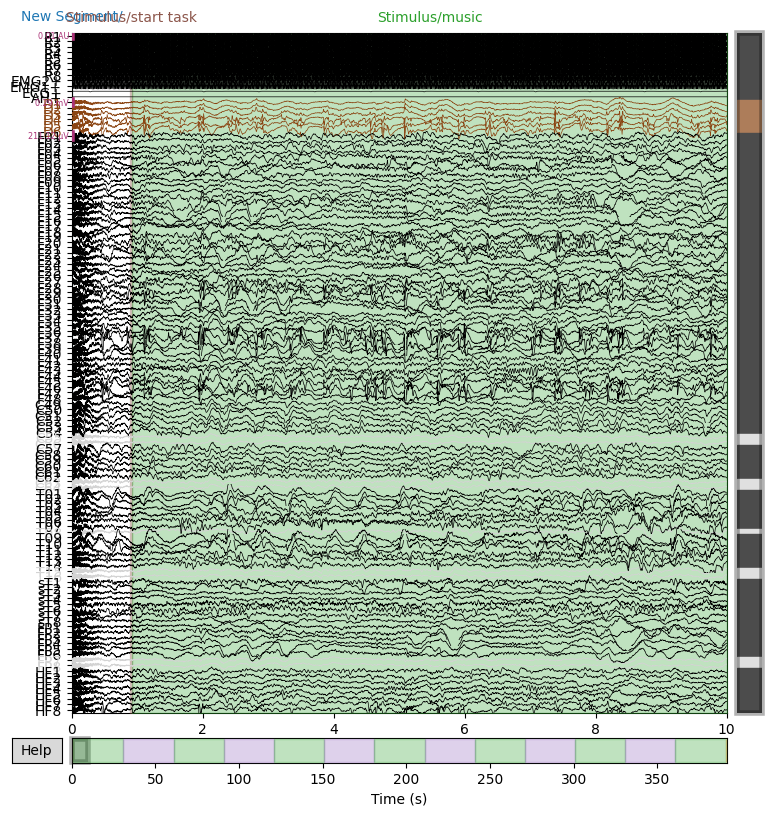

In [ ]:
import mne
import mne_bids
import pandas as pd

# Define your BIDS root directory where the dataset is stored
bids_root = '/content/drive/MyDrive/Dataset iEEG'

# Set the subject, session, task, and acquisition identifiers as per the dataset
subject = '03'           # example subject ID
session = 'iemu'         # session ID from dataset
task = 'film'            # task label as per dataset
acquisition = 'clinical' # acquisition label as per dataset
datatype = 'ieeg'        # modality

# Create BIDSPath to channels.tsv file to read channel info
channels_path = mne_bids.BIDSPath(subject=subject,
                                  session=session,
                                  task=task,
                                  acquisition=acquisition,
                                  datatype=datatype,
                                  suffix='channels',
                                  extension='.tsv',
                                  root=bids_root)

# Load channels.tsv to get channel types and bad channel info
channels = pd.read_csv(str(channels_path.match()[0]), sep='\t')

# Create BIDSPath for the raw iEEG data file (.vhdr for BrainVision format)
raw_path = mne_bids.BIDSPath(subject=subject,
                             session=session,
                             task=task,
                             acquisition=acquisition,
                             datatype=datatype,
                             suffix='ieeg',
                             extension='.vhdr',
                             root=bids_root)

# Load the raw iEEG data
raw = mne.io.read_raw_brainvision(str(raw_path.match()[0]), preload=True)

# Map channel types using channels.tsv info
ch_types = {
    ch_name: ch_type.lower() if ch_type.lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
    for ch_name, ch_type in zip(raw.ch_names, channels['type'])
}
raw.set_channel_types(ch_types)

# Mark bad channels from channels.tsv without dropping
bad_chs = channels.loc[(channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad'), 'name'].tolist()
raw.info['bads'].extend(bad_chs)

# OPTIONAL: Notch filter to remove line noise at multiples of 50 Hz
raw.notch_filter(freqs=[50, 100, 150, 200, 250])

# OPTIONAL: Set EEG reference (Common Average Reference)
raw_car, _ = mne.set_eeg_reference(raw.copy(), ref_channels='average')

# Print summary info to confirm successful loading
print(f"Subject {subject} iEEG data loaded with {len(raw.ch_names)} channels")
print(f"Bad channels marked: {raw.info['bads']}")
print(f"Channel types:\n{pd.Series(raw.get_channel_types()).value_counts()}")

# Plot a snippet of the raw data with all channels visible (adjust scalings to avoid overlap)
raw.plot(n_channels=len(raw.ch_names), scalings='auto', title=f"Subject {subject} iEEG Data")

# Now raw or raw_car is ready for further processing or model input


Extracting parameters from /content/drive/MyDrive/Dataset iEEG/sub-06/ses-iemu/ieeg/sub-06_ses-iemu_task-film_acq-clinical_run-1_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 203145  =      0.000 ...   396.768 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)



<ipython-input-12-c03c5be1455a>:46: RuntimeWarning: The unit for channel(s) ECG+, MKR1+, MKR2+, R1+, R2+, R3+, abdo+, thor+ has changed from V to NA.
  raw.set_channel_types(ch_types)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.9s


ECoG channel type selected for re-referencing


[Parallel(n_jobs=1)]: Done 104 out of 104 | elapsed:    1.4s finished


Applying average reference.
Applying a custom ('ECoG',) reference.
Subject 06 iEEG data loaded with 112 channels
Bad channels marked: ['P48', 'T03']
Channel types:
ecog    104
misc      8
Name: count, dtype: int64


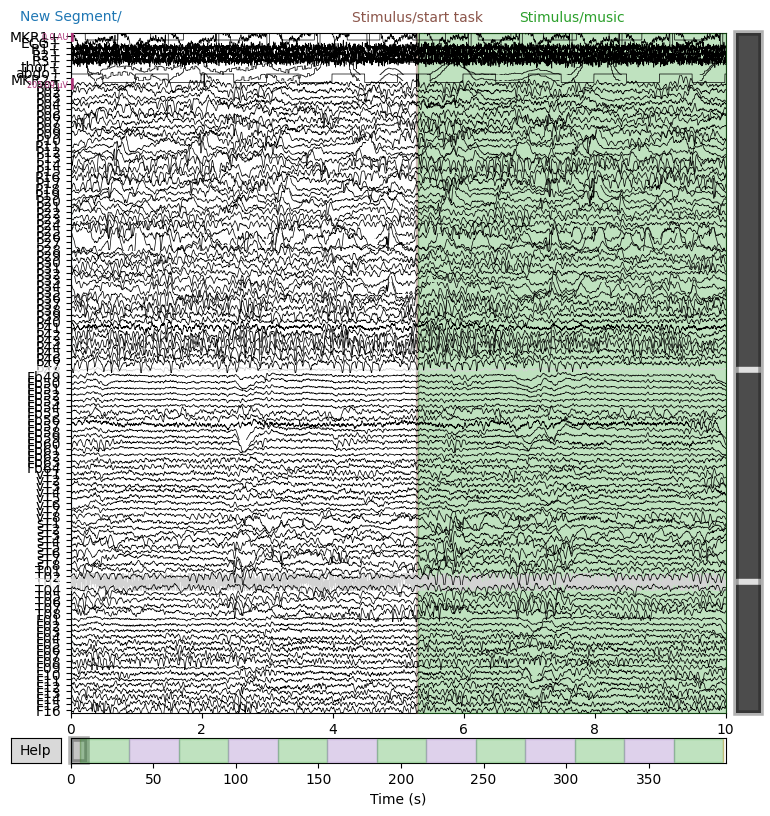

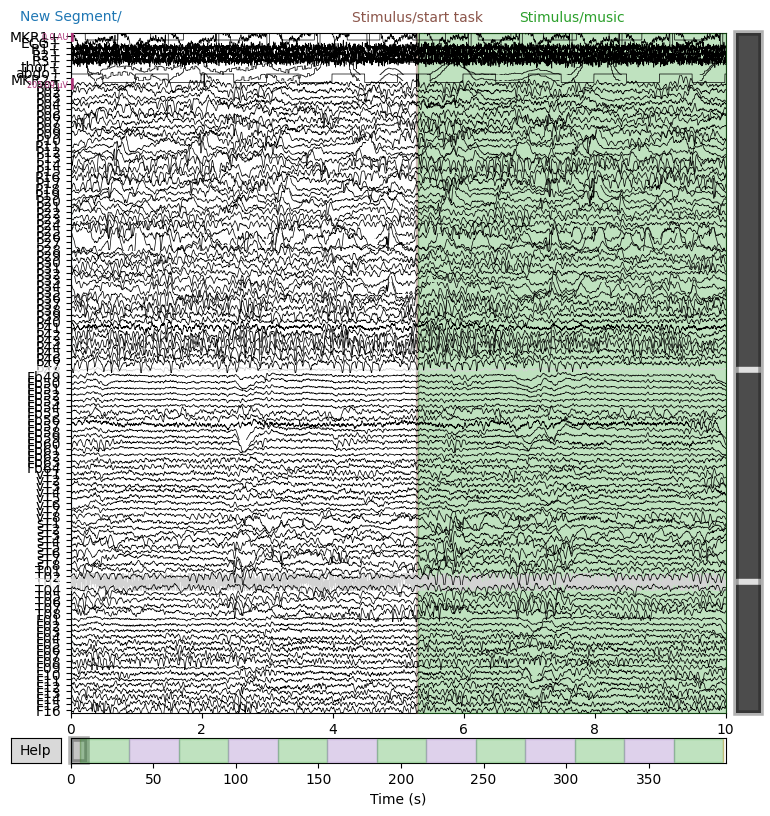

In [ ]:
import mne
import mne_bids
import pandas as pd

# Define your BIDS root directory where the dataset is stored
bids_root = '/content/drive/MyDrive/Dataset iEEG'

# Set the subject, session, task, and acquisition identifiers as per the dataset
subject = '06'           # example subject ID
session = 'iemu'         # session ID from dataset
task = 'film'            # task label as per dataset
acquisition = 'clinical' # acquisition label as per dataset
datatype = 'ieeg'        # modality

# Create BIDSPath to channels.tsv file to read channel info
channels_path = mne_bids.BIDSPath(subject=subject,
                                  session=session,
                                  task=task,
                                  acquisition=acquisition,
                                  datatype=datatype,
                                  suffix='channels',
                                  extension='.tsv',
                                  root=bids_root)

# Load channels.tsv to get channel types and bad channel info
channels = pd.read_csv(str(channels_path.match()[0]), sep='\t')

# Create BIDSPath for the raw iEEG data file (.vhdr for BrainVision format)
raw_path = mne_bids.BIDSPath(subject=subject,
                             session=session,
                             task=task,
                             acquisition=acquisition,
                             datatype=datatype,
                             suffix='ieeg',
                             extension='.vhdr',
                             root=bids_root)

# Load the raw iEEG data
raw = mne.io.read_raw_brainvision(str(raw_path.match()[0]), preload=True)

# Map channel types using channels.tsv info
ch_types = {
    ch_name: ch_type.lower() if ch_type.lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
    for ch_name, ch_type in zip(raw.ch_names, channels['type'])
}
raw.set_channel_types(ch_types)

# Mark bad channels from channels.tsv without dropping
bad_chs = channels.loc[(channels['type'].isin(['ECOG', 'SEEG'])) & (channels['status'] == 'bad'), 'name'].tolist()
raw.info['bads'].extend(bad_chs)

# OPTIONAL: Notch filter to remove line noise at multiples of 50 Hz
raw.notch_filter(freqs=[50, 100, 150, 200, 250])

# OPTIONAL: Set EEG reference (Common Average Reference)
raw_car, _ = mne.set_eeg_reference(raw.copy(), ref_channels='average')

# Print summary info to confirm successful loading
print(f"Subject {subject} iEEG data loaded with {len(raw.ch_names)} channels")
print(f"Bad channels marked: {raw.info['bads']}")
print(f"Channel types:\n{pd.Series(raw.get_channel_types()).value_counts()}")

# Plot a snippet of the raw data with all channels visible (adjust scalings to avoid overlap)
raw.plot(n_channels=len(raw.ch_names), scalings='auto', title=f"Subject {subject} iEEG Data")

# Now raw or raw_car is ready for further processing or model input
